# Importing tools

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import nltk
import re
import plotly.graph_objects as go

from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS 
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_validate, StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS, CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz, plot_tree
from sklearn.naive_bayes import MultinomialNB

sns.set()

# Importing dataset & Labelling

In [2]:
fake_df = pd.read_csv('Fake.csv') 
fake_df['label'] = 0
fake_df.head()

,title,text,subject,date,label
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",0
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",0
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",0
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",0
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",0


In [3]:
true_df = pd.read_csv('True.csv')
true_df['label'] = 1
true_df.head()

,title,text,subject,date,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [4]:
print("Size of true dataset", true_df.shape)
print("-"*20)
print("Size of fake dataset", fake_df.shape)

Size of true dataset (21417, 5)
--------------------
Size of fake dataset (23481, 5)


# Data Cleaning

In [5]:
df = pd.concat([true_df, fake_df]).reset_index(drop=True)
print(df.shape)
df

(44898, 5)


,title,text,subject,date,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",0
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",0


In [6]:
# dates distribution
fig = go.Figure(layout=go.Layout(title='Date Distribution',yaxis_title='No. of news',xaxis_title='Date'))

fig.add_trace(go.Scatter(y=df[df.label==1].groupby(['date']).label.count(), mode='lines', name='True'))
fig.add_trace(go.Scatter(x=df[df.label==0].groupby(['date']).label.count().index,y=df[df.label==0].groupby(['date']).label.count(), mode='lines', name='Fake'))

fig.show()

#### Comments: It is observed that the date distribution illustrated above is heavily skewed. 

In [7]:
# drop date
df = df.drop(columns = ['date'])
df

,title,text,subject,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,1
...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,0
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,0


In [8]:
# check subject for fake news
print("Subject \t   Count")
print(df[df.label==0].subject.value_counts())

print("-"*30)

# check subject for real news
print("Subject \tCount")
print(df[df.label==1].subject.value_counts())

Subject 	   Count
News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64
------------------------------
Subject 	Count
politicsNews    11272
worldnews       10145
Name: subject, dtype: int64


#### Comments: Real and fake news have distinct subject labels. Hence, it is not useful to use it as one of the parameters for the classifiers.

In [9]:
df = df.drop(columns = ['subject'])
df

,title,text,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,1
...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,0
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,0


In [10]:
# title and text to all lower case
df.title = df.title.str.lower()
df.text = df.text.str.lower()
## This will help improve accuracy of models

In [11]:
nltk_stopwords = stopwords.words('english')
wordcloud_stopwords = STOPWORDS

nltk_stopwords.extend(wordcloud_stopwords)

stopwords = set(nltk_stopwords)
print(stopwords)

{'did', 'o', 'most', 'too', 'these', 'only', 'hers', 'yourself', 'should', 'which', 'wasn', "couldn't", "that'll", 'shan', 'as', "haven't", 'now', 'those', 'because', 'off', 'through', 'just', 'was', 'or', "isn't", "wasn't", "don't", "who's", 'wouldn', 'hence', "i'm", "should've", 'k', "weren't", 're', 'would', 'they', 'it', 'over', "aren't", "won't", 'in', 'once', 'after', "she'll", 'few', "he'll", 'who', 't', 'so', "there's", 'like', 'nor', 'any', 'can', 'didn', 'won', 'also', 'the', "you're", 'i', 'otherwise', "he's", 'cannot', "why's", 've', "you've", "that's", 'whom', 'against', "wouldn't", 'down', "they'll", "they've", 'your', "shan't", 'than', 'ourselves', 'up', 'has', 'my', "you'd", 'about', "we'll", 'hadn', 'you', 'that', 'isn', "i've", 'is', 'r', 'themselves', 'by', 'am', 'such', "they're", 'what', 'below', "he'd", 'were', 'our', 'shall', 'more', 'same', 'here', 'ever', "here's", 'she', "mustn't", 'do', "needn't", 'from', 'are', 'www', 'have', 'with', 'ours', 'her', 'this', '

In [12]:
def clean(text):
    
    if text == " " or text =="  ":
        text = ""
    
    # remove url
    text = re.sub("http\S+", " ", str(text))
    
    # remove punctuation and special character
    text = re.sub("\W"," ", str(text))
    
    # remove stop word 
    text = " ".join(str(i) for i in text.split() if i not in stopwords)
    
    return text

In [13]:
df['title'] = df['title'].map(lambda x: clean(x))
df['text'] = df['text'].map(lambda x: clean(x))

In [14]:
# check for empty samples (empty text)
df[df.text == '']

,title,text,label
8970,graphic supreme court roundup,,1
30775,,,0
32340,take poll think president trump pick replace j...,,0
32458,joe scarborough berates mika brzezinski cheap ...,,0
32607,watch tucker carlson scorch sanctuary city may...,,0
...,...,...,...
43244,video hillary clinton religious beliefs must c...,,0
43274,video ice protecting obama release names crimi...,,0
43286,,,0
43287,,,0


In [15]:
# remove empty samples (empty text)
df.drop(df[df.text == ''].index.tolist(), inplace=True)

print(df.shape)

(44182, 3)


In [16]:
# check for duplicates in text
df[df.duplicated(['text'], keep=False)]

,title,text,label
17,trump twitter dec 26 hillary clinton tax cut bill,following statements posted verified twitter a...,1
24,failed vote oust president shakes peru politics,lima reuters peru president pedro pablo kuczyn...,1
33,callista gingrich becomes trump envoy pope dif...,vatican city reuters callista gingrich wife fo...,1
105,trump u choice deal north korea arms challenge,washington reuters president donald trump unve...,1
121,trump say security speech china competitor off...,washington reuters president donald trump lay ...,1
...,...,...,...
44893,mcpain john mccain furious iran treated us sai...,21st century wire says 21wire reported earlier...,0
44894,justice yahoo settles e mail privacy class act...,21st century wire says familiar theme whenever...,0
44895,sunnistan us allied safe zone plan take territ...,patrick henningsen 21st century wireremember o...,0
44896,blow 700 million al jazeera america finally ca...,21st century wire says al jazeera america go h...,0


In [17]:
# remove duplicates in text
df.drop(df[df.duplicated(['text'])].index.tolist(),inplace=True)
df.shape

(38314, 3)

In [18]:
# contain only title and label
df_title = df.drop(columns = ['text'])

df_title

,title,label
0,u budget fight looms republicans flip fiscal s...,1
1,u military accept transgender recruits monday ...,1
2,senior u republican senator let mr mueller job,1
3,fbi russia probe helped australian diplomat ti...,1
4,trump wants postal service charge much amazon ...,1
...,...,...
44115,white house theatrics gun control,0
44116,activists terrorists media controls dictates n...,0
44117,boiler room surrender retreat heads roll ep 38,0
44118,federal showdown looms oregon blm abuse local ...,0


In [19]:
# contain only text and label
df_text = df.drop(columns = ['title'])

df_text

,text,label
0,washington reuters head conservative republica...,1
1,washington reuters transgender people allowed ...,1
2,washington reuters special counsel investigati...,1
3,washington reuters trump campaign adviser geor...,1
4,seattle washington reuters president donald tr...,1
...,...,...
44115,21st century wire says world stage men women m...,0
44116,randy johnson 21st century wirethe majority ma...,0
44117,tune alternate current radio network acr anoth...,0
44118,21st century wire says new front opened long b...,0


In [20]:
# combine title and text
df.text = df.title + ' ' + df.text

# drop title
df = df.drop(columns = ['title'])
df

,text,label
0,u budget fight looms republicans flip fiscal s...,1
1,u military accept transgender recruits monday ...,1
2,senior u republican senator let mr mueller job...,1
3,fbi russia probe helped australian diplomat ti...,1
4,trump wants postal service charge much amazon ...,1
...,...,...
44115,white house theatrics gun control 21st century...,0
44116,activists terrorists media controls dictates n...,0
44117,boiler room surrender retreat heads roll ep 38...,0
44118,federal showdown looms oregon blm abuse local ...,0


In [21]:
# check empty title ^got text but no title
df_title[df_title.title == '']

## no empty title

,title,label


In [22]:
# check for duplicated titles ^different text but same title
df_title[df_title.duplicated(keep=False)]

,title,label
670,former intelligence officials say trump manipu...,1
1281,white house says lawfully pay obamacare subsidies,1
1282,white house says lawfully pay obamacare subsidies,1
1679,anti assad nations say syria reconstruction po...,1
2168,factbox key issues nafta renegotiations,1
...,...,...
32337,media ignores time bill clinton fired fbi dire...,0
32345,former fbi asst director jim comey danced devi...,0
32347,former fbi asst director jim comey danced devi...,0
37229,video watch marco rubio handles reporter attem...,0


In [23]:
# remove duplicated titles
df_title.drop(df_title[df_title.duplicated()].index.tolist(),inplace=True)
df_title.shape

(38196, 2)

<AxesSubplot:title={'center':'df_title'}>

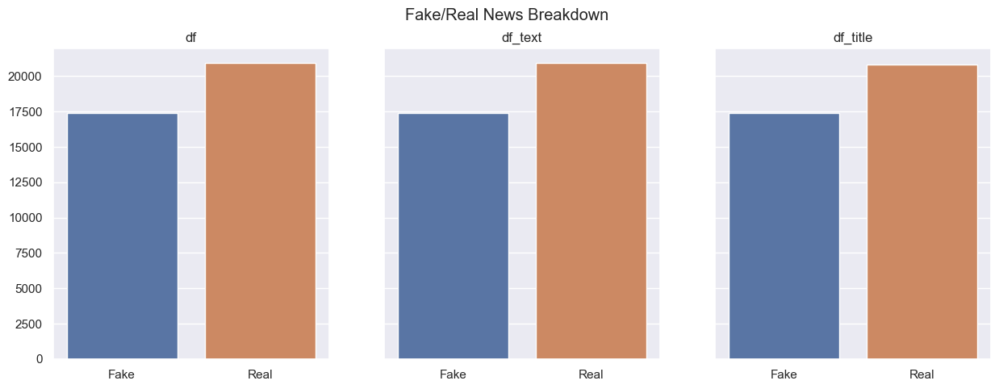

In [24]:
f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 5))
f.suptitle('Fake/Real News Breakdown')

axes[0].set_title('df')
sns.barplot(ax=axes[0], x=['Fake','Real'], y=[np.sum(df['label'] == 0), np.sum(df['label'] == 1)])

axes[1].set_title('df_text')
sns.barplot(ax=axes[1], x=['Fake','Real'], y=[np.sum(df_text['label'] == 0), np.sum(df_text['label'] == 1)])

axes[2].set_title('df_title')
sns.barplot(ax=axes[2], x=['Fake','Real'], y=[np.sum(df_title['label'] == 0), np.sum(df_title['label'] == 1)])

#### Cannot tell the difference (y increses by 2500 everytime)

<AxesSubplot:title={'center':'df_title'}>

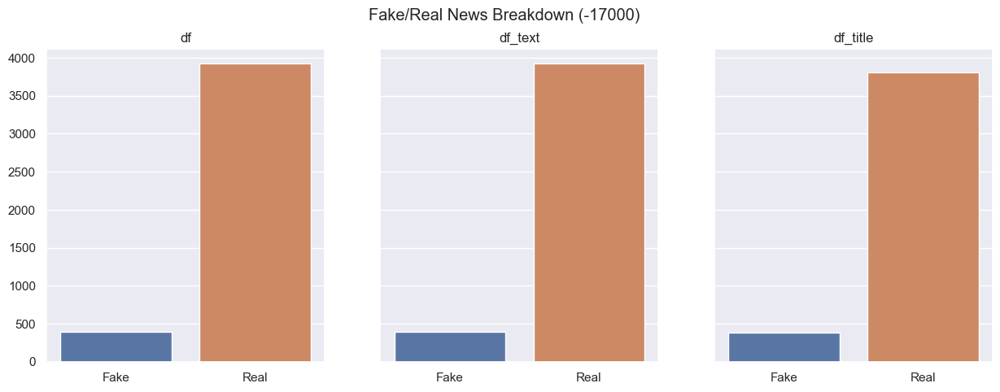

In [25]:
f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 5))
f.suptitle('Fake/Real News Breakdown (-17000)')

axes[0].set_title('df')
sns.barplot(ax=axes[0], x=['Fake','Real'], y=[np.sum(df['label'] == 0)-17000, np.sum(df['label'] == 1)-17000])

axes[1].set_title('df_text')
sns.barplot(ax=axes[1], x=['Fake','Real'], y=[np.sum(df_text['label'] == 0)-17000, np.sum(df_text['label'] == 1)-17000])

axes[2].set_title('df_title')
sns.barplot(ax=axes[2], x=['Fake','Real'], y=[np.sum(df_title['label'] == 0)-17000, np.sum(df_title['label'] == 1)-17000])

#### Number of fake news seems to be the same for all three; df_title contains a smaller number of real news compare to df and df_text

In [26]:
print ("df:") 
print (df)
print("-"*63)
print ("df_text:")
print (df_text)
print("-"*63)
print ("df_title:")
print (df_title)

df:
                                                    text  label
0      u budget fight looms republicans flip fiscal s...      1
1      u military accept transgender recruits monday ...      1
2      senior u republican senator let mr mueller job...      1
3      fbi russia probe helped australian diplomat ti...      1
4      trump wants postal service charge much amazon ...      1
...                                                  ...    ...
44115  white house theatrics gun control 21st century...      0
44116  activists terrorists media controls dictates n...      0
44117  boiler room surrender retreat heads roll ep 38...      0
44118  federal showdown looms oregon blm abuse local ...      0
44119  troubled king chicago rahm emanuel desperate s...      0

[38314 rows x 2 columns]
---------------------------------------------------------------
df_text:
                                                    text  label
0      washington reuters head conservative republica...      1
1

#### Due to the difference in number of samples, we decided to segregate text and titles to determine accuracy using different parameters

# Parameters Preparation

In [27]:
a = df_title['title']   #News title only
b = df_title['label']   # News label

f = df_text['text']     #News text only
g = df_text['label']    # News label

i = df['text']          #New text and title combined
j = df['label']         # News label

a_train, a_test, b_train, b_test, = train_test_split(a, b, train_size=0.25, random_state=42)
f_train, f_test, g_train, g_test, = train_test_split(f, g, train_size=0.25, random_state=42)
i_train, i_test, j_train, j_test, = train_test_split(i, j, train_size=0.25, random_state=42)

In [28]:
vectorizer = TfidfVectorizer(stop_words='english')

a_train = vectorizer.fit_transform(a_train)
a_test = vectorizer.transform(a_test)

f_train = vectorizer.fit_transform(f_train)
f_test = vectorizer.transform(f_test)

i_train = vectorizer.fit_transform(i_train)
i_test = vectorizer.transform(i_test)

# Function: Run Classifiers

In [29]:
def pred(model, condition):
    
    # Set Parameters
    if condition == 'title':
        X_train = a_train
        X_test = a_test
        y_train = b_train
        y_test = b_test
        condition = 'Classification using Title only'
        print(condition)
    elif condition == 'text':
        X_train = f_train
        X_test = f_test
        y_train = g_train
        y_test = g_test
        condition = 'Classification using Text only'
        print(condition)
    elif condition == 'titleNtext':
        X_train = i_train
        X_test = i_test
        y_train = j_train
        y_test = j_test
        condition = 'Classification using both Title and Text'
        print(condition)
    
    # Creating the classification model and fitting the training data to it
    if model == 'dt':
        model = 'Decision Tree Classifier'
        print(model)
        mod = DecisionTreeClassifier(max_depth = 2).fit(X_train, y_train)
    elif model == 'lr':
        model = 'Logistic Regression Classifier'
        print(model)
        mod = LogisticRegression(random_state=42).fit(X_train,y_train)
    elif model == 'rf':
        model = 'Random Forest Classifier'
        print(model)
        mod = RandomForestClassifier(n_estimators=100, random_state=42).fit(X_train,y_train)
    elif model == 'nb':
        model = 'Naive Bayes Classifier'
        print(model)
        mod = MultinomialNB().fit(X_train, y_train)
    print()
    
    # Using the above, fit model to predict values based on the X inputs
    y_train_pred = mod.predict(X_train)
    y_test_pred = mod.predict(X_test)

    # Check the Goodness of Fit (on Train Data)
    print("Goodness of Fit of Model \tTrain Dataset")
    print("Classification Accuracy \t:", mod.score(X_train, y_train))
    print()

    # Check the Goodness of Fit (on Test Data)
    print("Goodness of Fit of Model \tTest Dataset")
    print("Classification Accuracy \t:", mod.score(X_test, y_test)) 
    print()
    
    # Results (classification report and confusion matrix)
    print(classification_report(y_test_pred,y_test))
    print(confusion_matrix(y_test_pred,y_test))
    print()
    
    # Plot the Confusion Matrix for Train and Test
    f, axes = plt.subplots(1, 2, figsize=(12, 4))
    f.suptitle(model+' - '+ condition)

    axes[0].set_title('train')
    sns.heatmap(confusion_matrix(y_train, y_train_pred), cmap= 'Blues',
                annot = True, fmt='.0f', annot_kws={'size': 18}, 
                xticklabels = ['Fake','Real'], yticklabels = ['Fake','Real'],
                ax = axes[0])
    axes[0].set_xlabel('Actual')
    axes[0].set_ylabel('Predicted')

    axes[1].set_title('test')
    sns.heatmap(confusion_matrix(y_test, y_test_pred), cmap= 'Blues',
                annot = True, fmt='.0f', annot_kws={'size': 18}, 
                xticklabels = ['Fake','Real'], yticklabels = ['Fake','Real'],
                ax = axes[1])
    axes[1].set_xlabel('Actual')
    axes[1].set_ylabel('Predicted')

    plt.show()

# Classification Tree

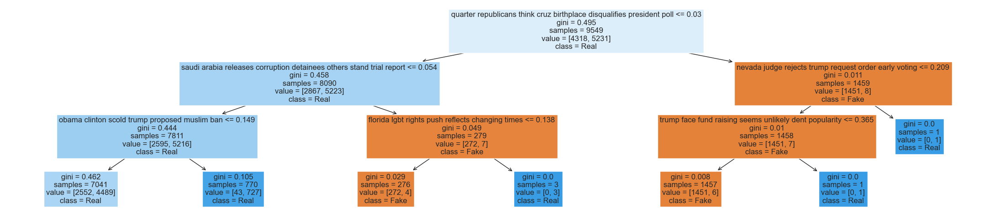

In [30]:
dtree = DecisionTreeClassifier(max_depth = 3)
dtree = dtree.fit(a_train, b_train)

#Depending on which variates chosen, 'feature names' changes to match the variate chosen

fig = plt.figure(figsize = (28,6))
f = plot_tree(dtree, feature_names = df_title['title'], fontsize = 12, filled = True, 
              class_names = ['Fake', 'Real'])

Classification using Title only
Decision Tree Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7267776730547701

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7222047683876147

              precision    recall  f1-score   support

           0       0.39      0.99      0.56      5201
           1       1.00      0.66      0.80     23446

    accuracy                           0.72     28647
   macro avg       0.70      0.83      0.68     28647
weighted avg       0.89      0.72      0.75     28647

[[ 5156    45]
 [ 7913 15533]]



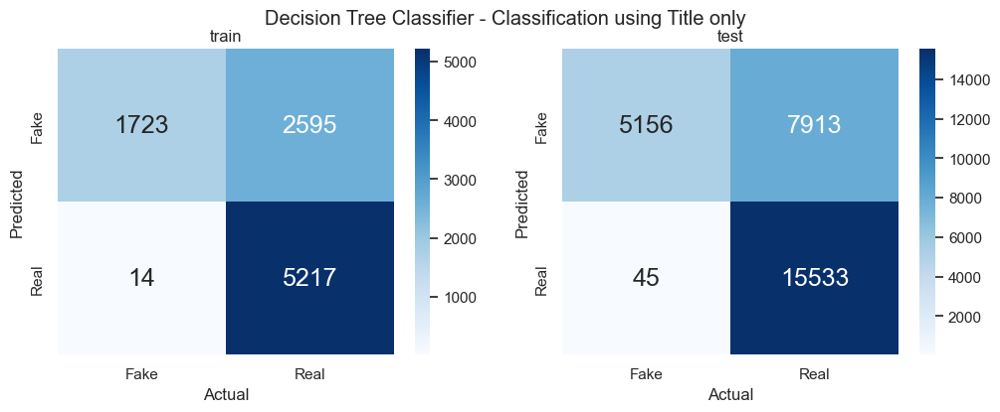

In [31]:
#Classification using Title only
pred('dt', 'title')

Classification using Text only
Decision Tree Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9959281687199832

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9946756681514477

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12978
           1       1.00      0.99      1.00     15758

    accuracy                           0.99     28736
   macro avg       0.99      0.99      0.99     28736
weighted avg       0.99      0.99      0.99     28736

[[12949    29]
 [  124 15634]]



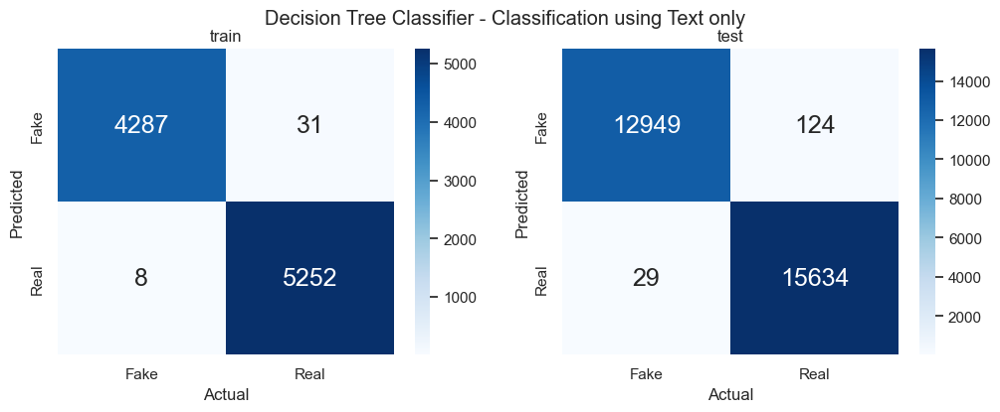

In [32]:
#Classification using Text only
pred('dt', 'text')

Classification using both Title and Text
Decision Tree Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9959281687199832

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9945712694877505

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12975
           1       1.00      0.99      1.00     15761

    accuracy                           0.99     28736
   macro avg       0.99      0.99      0.99     28736
weighted avg       0.99      0.99      0.99     28736

[[12946    29]
 [  127 15634]]



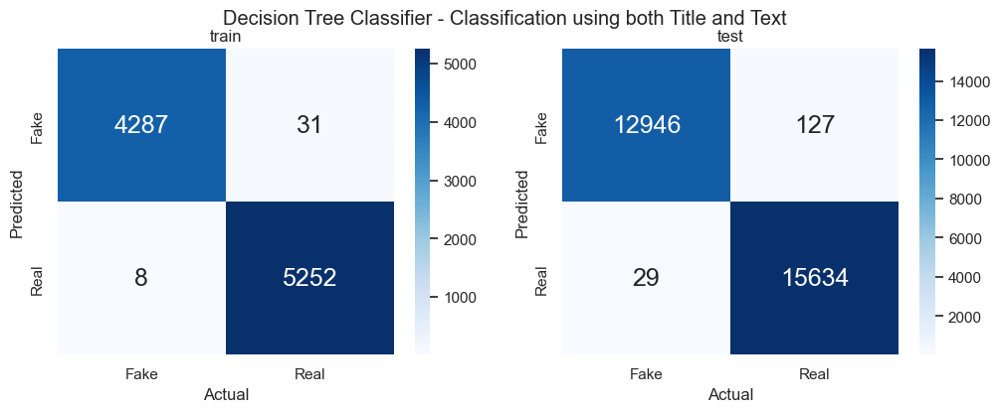

In [33]:
#Classification using both Title and Test
pred('dt', 'titleNtext')

# Logistic Regression

Classification using Title only
Logistic Regression Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9605194261179181

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.915942332530457

              precision    recall  f1-score   support

           0       0.87      0.94      0.90     11985
           1       0.96      0.90      0.93     16662

    accuracy                           0.92     28647
   macro avg       0.91      0.92      0.91     28647
weighted avg       0.92      0.92      0.92     28647

[[11323   662]
 [ 1746 14916]]



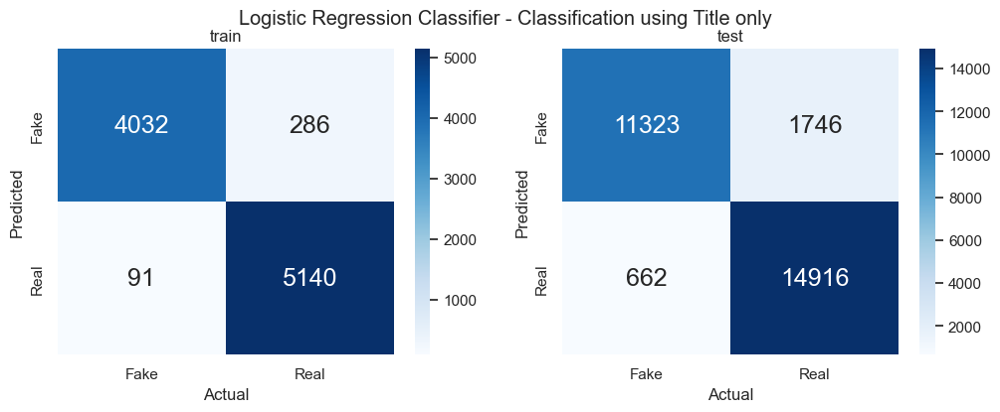

In [34]:
#Classification using Title only
pred('lr', 'title')

Classification using Text only
Logistic Regression Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9865316349968678

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9764059020044543

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     12759
           1       0.99      0.97      0.98     15977

    accuracy                           0.98     28736
   macro avg       0.98      0.98      0.98     28736
weighted avg       0.98      0.98      0.98     28736

[[12577   182]
 [  496 15481]]



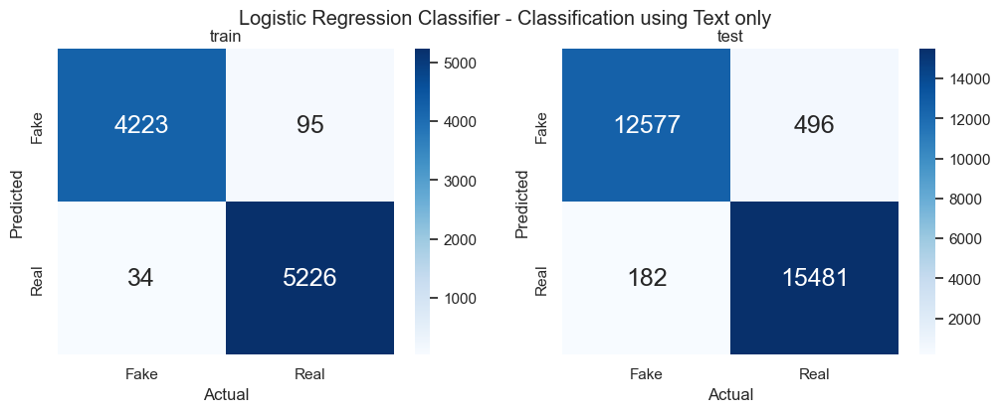

In [35]:
#Classification using Text only
pred('lr', 'text')

Classification using both Title and Text
Logistic Regression Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9872624765086657

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9768582962138085

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     12770
           1       0.99      0.97      0.98     15966

    accuracy                           0.98     28736
   macro avg       0.98      0.98      0.98     28736
weighted avg       0.98      0.98      0.98     28736

[[12589   181]
 [  484 15482]]



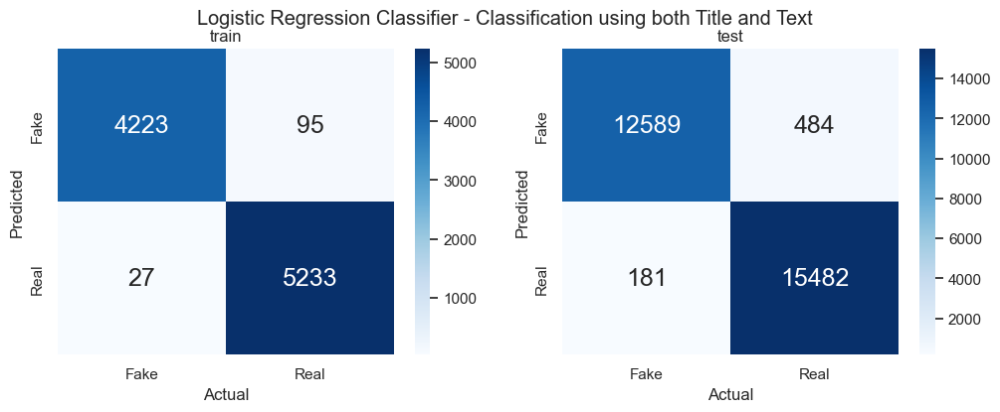

In [36]:
#Classification using both Title and Text
pred('lr', 'titleNtext')

# Random Forest Classifier

Classification using Title only
Random Forest Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9034453869515132

              precision    recall  f1-score   support

           0       0.83      0.95      0.89     11453
           1       0.96      0.87      0.92     17194

    accuracy                           0.90     28647
   macro avg       0.90      0.91      0.90     28647
weighted avg       0.91      0.90      0.90     28647

[[10878   575]
 [ 2191 15003]]



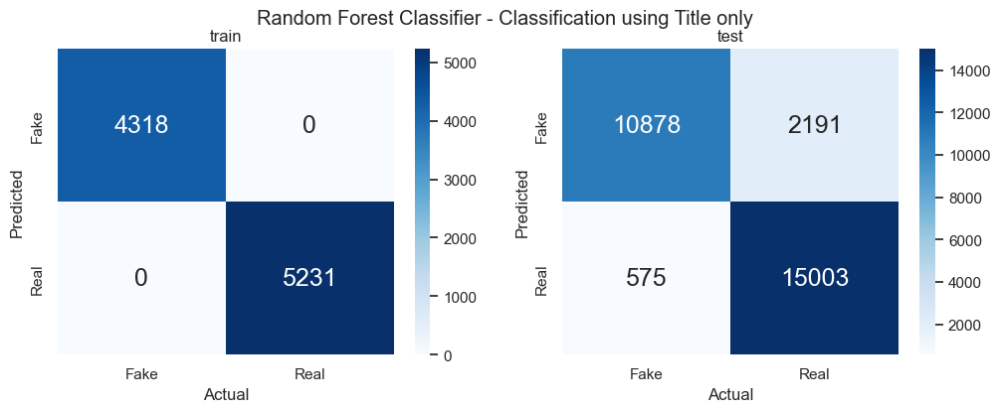

In [37]:
#Classification using title only
pred('rf', 'title')

Classification using Text only
Random Forest Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.982739420935412

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     12813
           1       0.99      0.98      0.98     15923

    accuracy                           0.98     28736
   macro avg       0.98      0.98      0.98     28736
weighted avg       0.98      0.98      0.98     28736

[[12695   118]
 [  378 15545]]



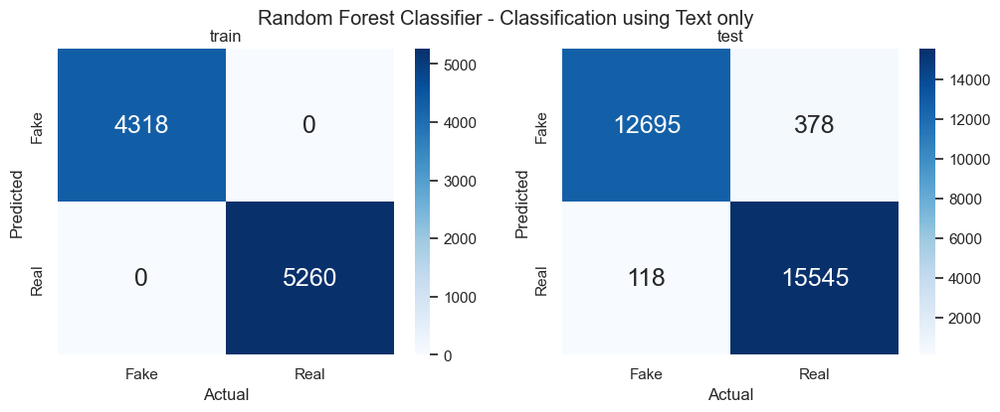

In [38]:
#Classification using text only
pred('rf','text')

Classification using both Title and Text
Random Forest Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9812430400890868

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     12800
           1       0.99      0.97      0.98     15936

    accuracy                           0.98     28736
   macro avg       0.98      0.98      0.98     28736
weighted avg       0.98      0.98      0.98     28736

[[12667   133]
 [  406 15530]]



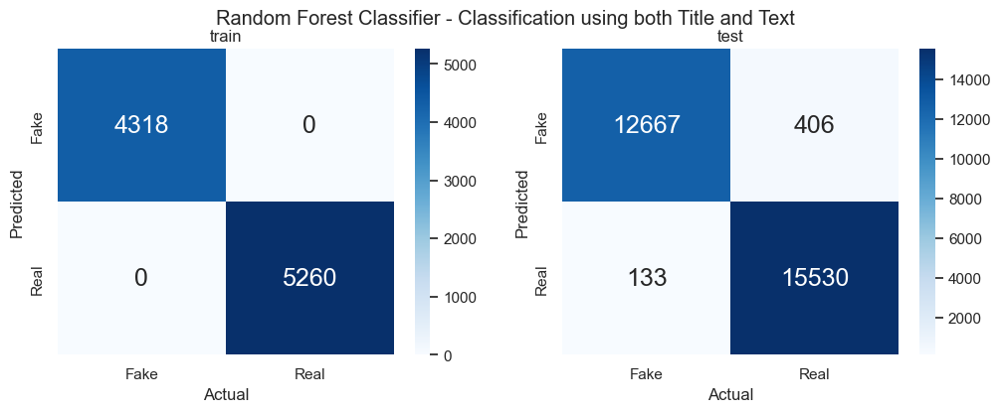

In [39]:
#Classification using both title and text
pred('rf','titleNtext')

# Naive Bayes Classifier

Classification using Title only
Naive Bayes Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.961043041156142

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.923517296750096

              precision    recall  f1-score   support

           0       0.90      0.93      0.91     12600
           1       0.94      0.92      0.93     16047

    accuracy                           0.92     28647
   macro avg       0.92      0.92      0.92     28647
weighted avg       0.92      0.92      0.92     28647

[[11739   861]
 [ 1330 14717]]



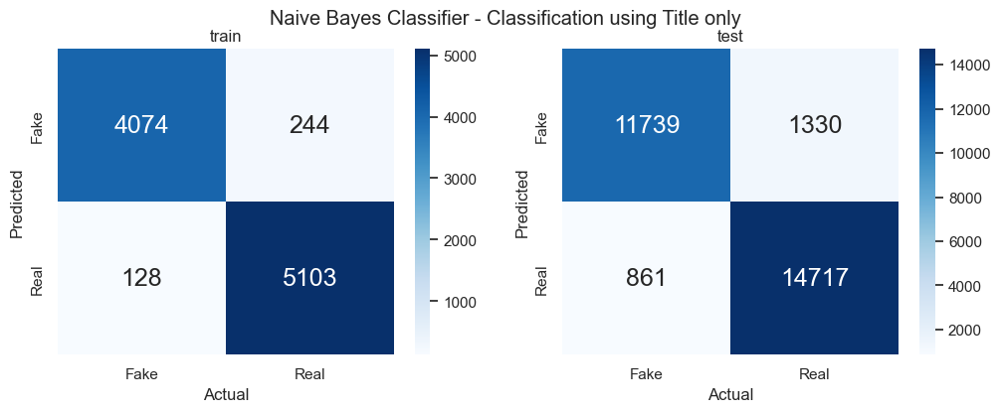

In [40]:
#Classification using Title only
pred('nb', 'title')

Classification using Text only
Naive Bayes Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9376696596366674

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9187082405345212

              precision    recall  f1-score   support

           0       0.85      0.97      0.91     11545
           1       0.97      0.89      0.93     17191

    accuracy                           0.92     28736
   macro avg       0.91      0.93      0.92     28736
weighted avg       0.93      0.92      0.92     28736

[[11141   404]
 [ 1932 15259]]



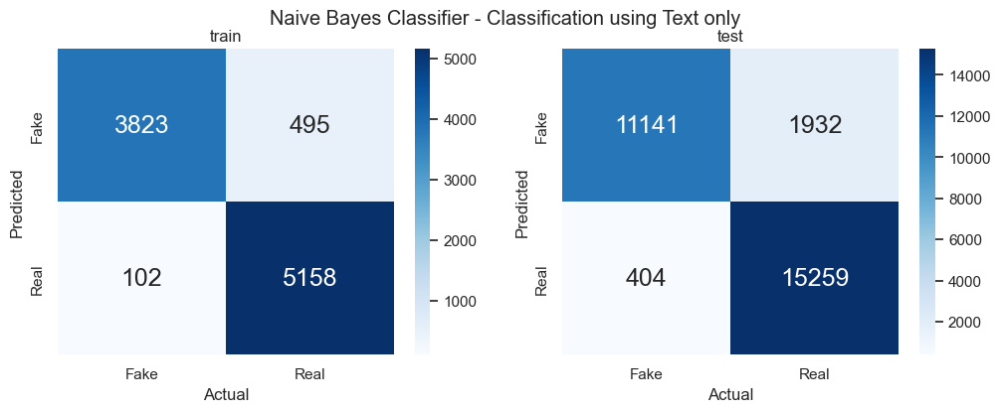

In [41]:
# Classification using Text only
pred('nb','text')

Classification using both Title and Text
Naive Bayes Classifier

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9414282731259136

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.923510579064588

              precision    recall  f1-score   support

           0       0.86      0.96      0.91     11711
           1       0.97      0.90      0.93     17025

    accuracy                           0.92     28736
   macro avg       0.92      0.93      0.92     28736
weighted avg       0.93      0.92      0.92     28736

[[11293   418]
 [ 1780 15245]]



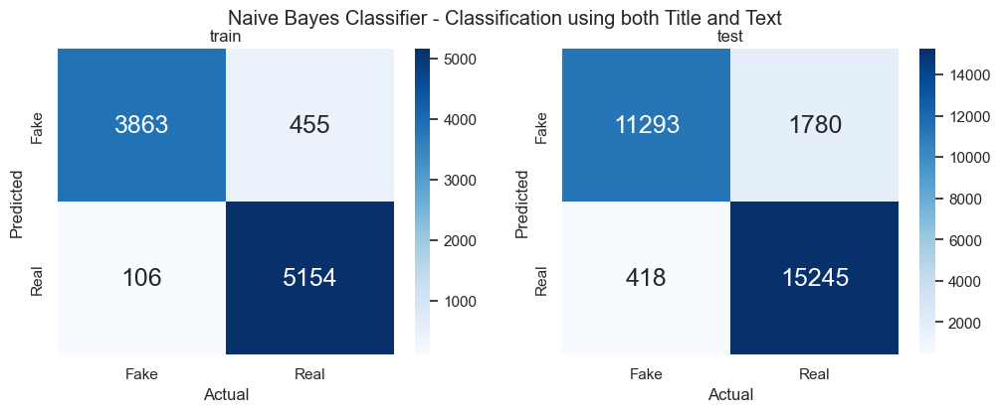

In [42]:
#Classification using both Title and Text
pred('nb', 'titleNtext')

# Word Cloud

In [43]:
fake = df[df.label == 0]
fake

,text,label
21417,donald trump sends embarrassing new year eve m...,0
21418,drunk bragging trump staffer started russian c...,0
21419,sheriff david clarke becomes internet joke thr...,0
21420,trump obsessed even obama name coded website i...,0
21421,pope francis called donald trump christmas spe...,0
...,...,...
44115,white house theatrics gun control 21st century...,0
44116,activists terrorists media controls dictates n...,0
44117,boiler room surrender retreat heads roll ep 38...,0
44118,federal showdown looms oregon blm abuse local ...,0


In [44]:
true = df[df.label == 1]
true

,text,label
0,u budget fight looms republicans flip fiscal s...,1
1,u military accept transgender recruits monday ...,1
2,senior u republican senator let mr mueller job...,1
3,fbi russia probe helped australian diplomat ti...,1
4,trump wants postal service charge much amazon ...,1
...,...,...
21411,north korea shipments syria chemical arms agen...,1
21413,lexisnexis withdrew two products chinese marke...,1
21414,minsk cultural hub becomes authorities minsk r...,1
21415,vatican upbeat possibility pope francis visiti...,1


In [45]:
def wordAppearance(df_data):
    
    text = ''
    
    for news in df_data.values:
        text += f" {news}"
    
    wordcloud = WordCloud(width = 3000, height = 2000,
        background_color = 'black',
        stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)

    fig = plt.figure(figsize = (40, 30), facecolor = 'k', edgecolor = 'k')

    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
    del text

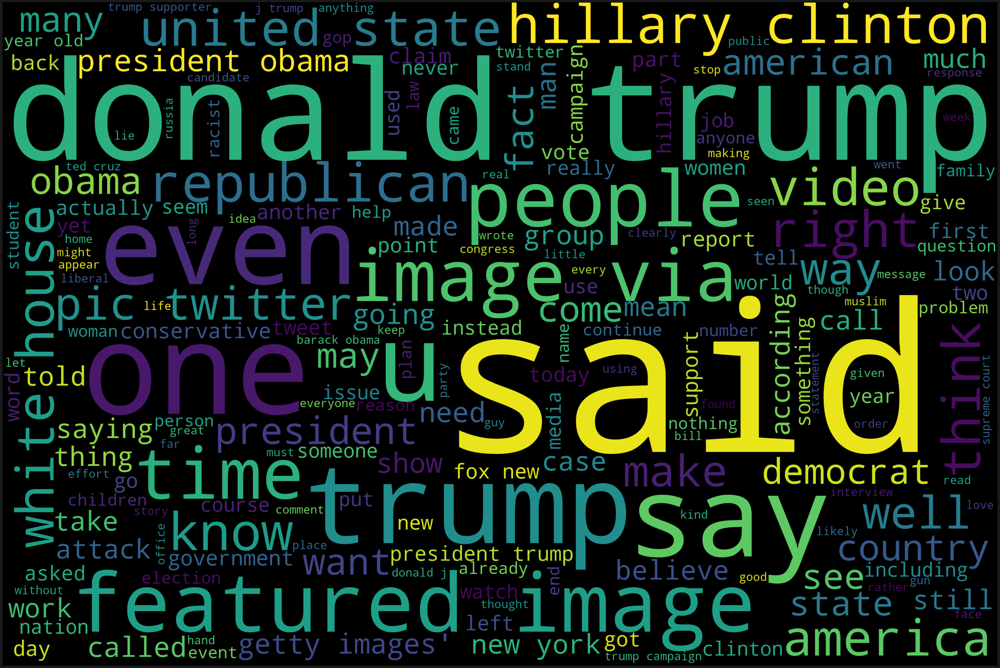

In [46]:
wordAppearance(fake)

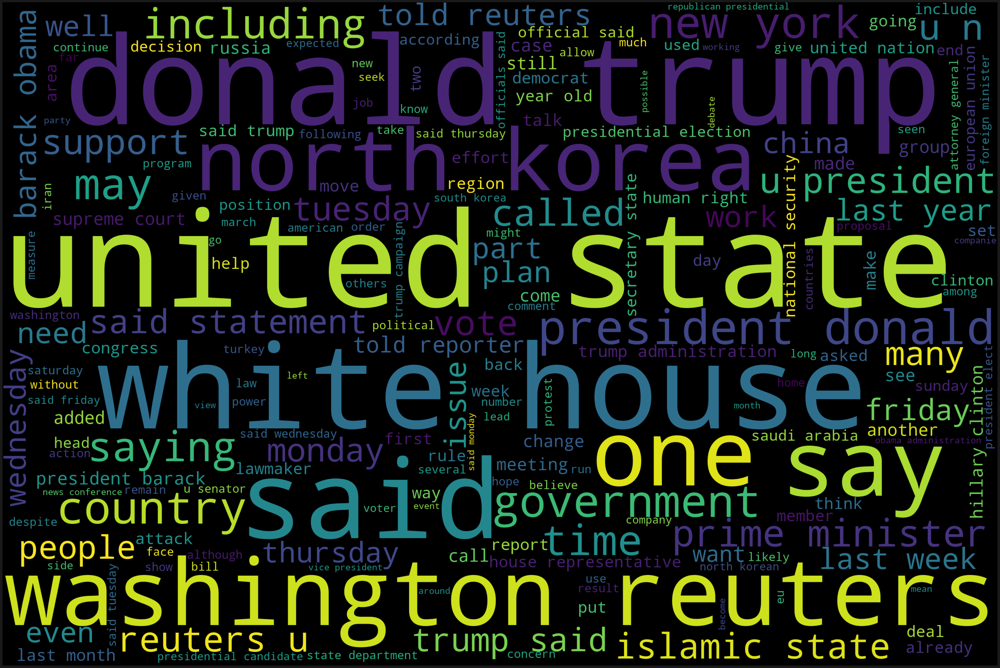

In [47]:
wordAppearance(true)